In [1]:
using LinearAlgebra
using Plots
using LaTeXStrings
using Plots

import QuanticsGrids as QG
import TensorCrossInterpolation as TCI
using QuanticsTCI: quanticscrossinterpolate, quanticsfouriermpo

In [2]:
# 考えるグリーン関数
function G0(ωn, k, kf = 0.1, m = 1.0)
    return 1.0 / (1.0im*ωn - (k^2-kf^2)/(2m))
end

G0 (generic function with 3 methods)

### G(iw_n, x)へのフーリエ変換

In [6]:
R = 31
R2 = 34
#kの積分範囲
kmax = 1.0
kmax2 = 1.0
kmin = 0.0
kmin2 = 0.0
qgrid = QG.DiscretizedGrid{1}(R, kmin, kmax; includeendpoint = true)
qgrid2 = QG.DiscretizedGrid{1}(R2, kmin2, kmax2; includeendpoint = true)

QuanticsGrids.DiscretizedGrid{1}(34, (0.0,), (1.0,), 2, :fused, true)

In [7]:
f(x) = G0(1e-1, x)

f (generic function with 1 method)

In [8]:
qtci, ranks, errors = quanticscrossinterpolate(ComplexF64, f, qgrid; tolerance=1e-10)
qtci2, ranks2, errors2 = quanticscrossinterpolate(ComplexF64, f, qgrid2; tolerance=1e-10)

(QuanticsTCI.QuanticsTensorCI2{ComplexF64}(TensorCrossInterpolation.TensorCI2{ComplexF64} with rank 8, QuanticsGrids.DiscretizedGrid{1}(34, (0.0,), (1.0,), 2, :fused, true), TensorCrossInterpolation.CachedFunction{ComplexF64, UInt128} with 2592 entries), [8, 8, 8], [5.923082624191467e-11, 7.80883949135345e-11, 7.80883949135345e-11])

In [9]:
fouriertt = quanticsfouriermpo(R; sign=1.0, normalize=true)
fouriertt2 = quanticsfouriermpo(R2; sign=1.0, normalize=true)
sitedims = [[2,1] for _ in 1:R]
sitedims2 = [[2,1] for _ in 1:R2]
ftt = TCI.TensorTrain(qtci.tci)
ftt2 = TCI.TensorTrain(qtci2.tci)
hftt = TCI.contract(fouriertt, ftt; algorithm=:naive, tolerance=1e-8)
hftt2 = TCI.contract(fouriertt2, ftt2; algorithm=:naive, tolerance=1e-8)

hftt *= 1/sqrt(2)^R
hftt2 *= 1/sqrt(2)^R2

@show hftt

hftt = TensorCrossInterpolation.TensorTrain{ComplexF64, 3} of rank 8


(::TensorCrossInterpolation.TensorTrain{ComplexF64, 3}) (generic function with 1 method)

In [24]:
kgrid = QG.InherentDiscreteGrid{1}(R, 0) # 0, 1, ..., 2^R-1
kgrid2 = QG.InherentDiscreteGrid{1}(R2, 0) # 0, 1, ..., 2^R-1


plotk = collect(0:2^(R-11):2^R-1)
plotk2 = collect(0:2^(R-11):2^R-1)
y = [hftt(reverse(QG.origcoord_to_quantics(kgrid, x))) for x in plotk] # Note: revert the order of the quantics indices
y2 = [hftt2(reverse(QG.origcoord_to_quantics(kgrid2, x))) for x in plotk2] # Note: revert the order of the quantics indices
p1 = plot()
plot!(p1, plotk, real.(y), marker=:circle, label="QFT")
plot!(p1, plotk2, real.(y2), marker=:x, label="QFT2")
#plot!(p1, plotk, real.(hfk.(plotk)), marker=:x, label="Reference")
xlabel!(p1, L"\mathrm{ind}_x")
ylabel!(p1, L"\mathrm{Re}~\hat{G}(\omega_n, x)")

p3 = plot()
plot!(p3, plotk, sqrt.((real.(y).^2 .+ 1e-8) ./ (real.(y2).^2 .+ 1e-8)), marker=:+, label="ratio", ylim=(0.9999, 1.0001))
plot!(p3, plotk, ones(length(plotk)), lw = 2.0, label="1")

p2 = plot()
plot!(p2, plotk, imag.(y), marker=:circle, label="QFT")
plot!(p2, plotk2, imag.(y2), marker=:x, label="QFT2")
#plot!(p2, plotk, imag.(hfk.(plotk)), marker=:x, label="Reference")
xlabel!(L"\mathrm{ind}_x")
ylabel!(L"\mathrm{Im}~\hat{G}(\omega_n, x)")

p4 = plot()
plot!(p4, plotk, sqrt.((imag.(y).^2 .+ 1e-8) ./(imag.(y2).^2 .+ 1e-8)), marker=:+, label="ratio", ylim=(0.9999, 1.0001))
plot!(p4, plotk, ones(length(plotk)), lw = 2.0, label="1")
println("done")

done


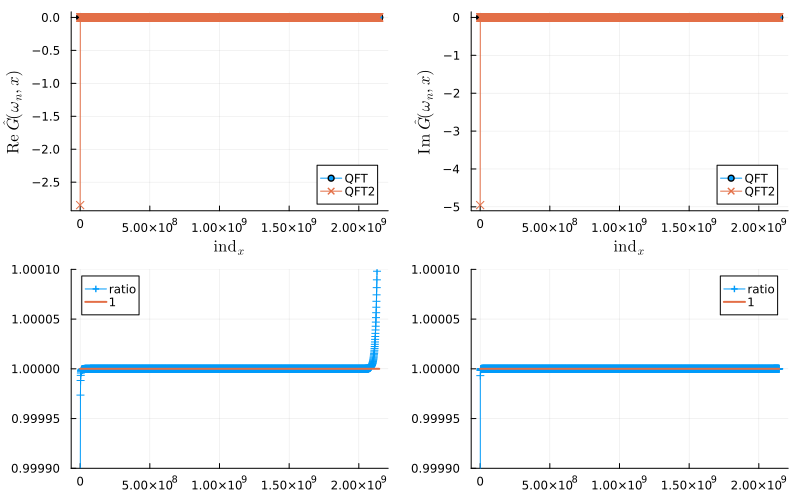

In [25]:
# 積分範囲やGridの数を変えると、どのように精度が変わるかを見る
plot(p1, p2, p3, p4, size=(800, 500))

In [26]:
### G(τ, k)へのフーリエ変換
T = 1e-3
wmax = T*(2^(R-1)-1)
wmin = -wmax
wgrid = QG.DiscretizedGrid{1}(R, wmin, wmax; includeendpoint = true)

QuanticsGrids.DiscretizedGrid{1}(31, (-1.073741823e6,), (1.073741823e6,), 2, :fused, true)

In [13]:
f0(x) = G0(x, 0.2)
qtci, ranks, errors = quanticscrossinterpolate(ComplexF64, f0, wgrid; tolerance=1e-10)

(QuanticsTCI.QuanticsTensorCI2{ComplexF64}(TensorCrossInterpolation.TensorCI2{ComplexF64} with rank 16, QuanticsGrids.DiscretizedGrid{1}(31, (-1.073741823e6,), (1.073741823e6,), 2, :fused, true), TensorCrossInterpolation.CachedFunction{ComplexF64, UInt128} with 8760 entries), [13, 16, 16, 16], [9.442666381026455e-11, 9.957061548503667e-11, 9.957061548503667e-11, 9.957061548503667e-11])

In [14]:
fouriertt = quanticsfouriermpo(R; sign=1.0, normalize=true)
sitedims = [[2,1] for _ in 1:R]
ftt = TCI.TensorTrain(qtci.tci)
hftt = TCI.contract(fouriertt, ftt; algorithm=:naive, tolerance=1e-8, sign=-1)

hftt *= 1/sqrt(2)^R

(::TensorCrossInterpolation.TensorTrain{ComplexF64, 3}) (generic function with 1 method)

In [19]:
maxindex = QG.origcoord_to_grididx(wgrid, 2.0^(-23))
testindices = Int.(round.(LinRange(1, maxindex, 1000)))
xs = [QG.grididx_to_origcoord(qgrid, i) for i in testindices]

1000-element Vector{Float64}:
 0.0
 0.0005005006680733062
 0.0010010008704853248
 0.001501501538558631
 0.0020020022066319374
 0.002502502409043956
 0.003003003077117262
 0.0035035032795292806
 0.004004003947602587
 0.004504504615675893
 ⋮
 0.49599599581956677
 0.49649649648764005
 0.4969969966900521
 0.4974974973581254
 0.4979979975605374
 0.4984984982286107
 0.49899899889668403
 0.499499499099096
 0.49999999976716936

In [23]:
hftt[1]

1×2×2 Array{ComplexF64, 3}:
[:, :, 1] =
 -231.346-226.271im  231.346+226.271im

[:, :, 2] =
 0.0301573+0.0294957im  0.0301573+0.0294957im

In [21]:
yci = [hftt(reverse(QG.origcoord_to_quantics(wgrid, x))) for x in testindices]

MethodError: MethodError: no method matching origcoord_to_grididx(::QuanticsGrids.DiscretizedGrid{1}, ::Tuple{Int64})
The function `origcoord_to_grididx` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  origcoord_to_grididx(::QuanticsGrids.DiscretizedGrid{1}, !Matched::Float64)
   @ QuanticsGrids ~/.julia/packages/QuanticsGrids/v8iJF/src/grid.jl:293
  origcoord_to_grididx(::QuanticsGrids.DiscretizedGrid, !Matched::NTuple{N, Float64}) where N
   @ QuanticsGrids ~/.julia/packages/QuanticsGrids/v8iJF/src/grid.jl:280
  origcoord_to_grididx(!Matched::QuanticsGrids.InherentDiscreteGrid, ::Union{Int64, NTuple{N, Int64}}) where N
   @ QuanticsGrids ~/.julia/packages/QuanticsGrids/v8iJF/src/grid.jl:207


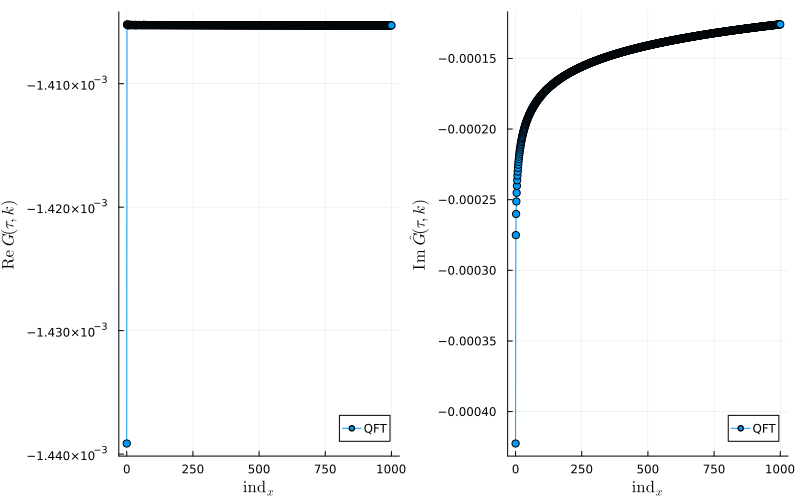

In [213]:
wgrid = QG.InherentDiscreteGrid{1}(R, 0)
scale = sqrt(2)^R
plotk = collect(0:1000)
y = [hftt(reverse(QG.origcoord_to_quantics(wgrid, 1000x))) for x in plotk] # Note: revert the order of the quantics indices
p1 = plot()
plot!(p1, plotk, scale .* real.(y), marker=:circle, label="QFT")
#plot!(p1, plotk, real.(hfk.(plotk)), marker=:x, label="Reference")
xlabel!(p1, L"\mathrm{ind}_x")
ylabel!(p1, L"\mathrm{Re}~\hat{G}(\tau, k)")

p2 = plot()
plot!(p2, plotk, scale .* imag.(y), marker=:circle, label="QFT")
#plot!(p2, plotk, imag.(hfk.(plotk)), marker=:x, label="Reference")
xlabel!(L"\mathrm{ind}_x")
ylabel!(L"\mathrm{Im}~\hat{G}(\tau, k)")
plot(p1, p2, size=(800, 500))

In [136]:
g(x, y) = G0(x, y)

g (generic function with 1 method)

In [137]:
T = 1e-4
wmax = T*(2^(R-1)-1)
wmin = -wmax
kmax = 200.0
kmin = -200.0
wkgrid = QG.DiscretizedGrid{2}(R, (wmin, kmin), (wmax, kmax); unfoldingscheme=:interleaved)

QuanticsGrids.DiscretizedGrid{2}(31, (-107374.1823, -200.0), (107374.1823, 200.0), 2, :interleaved, false)

In [138]:
qtci_wk, ranks_wk, errors_wk = quanticscrossinterpolate(ComplexF64, g, wkgrid; tolerance=1e-10)

(QuanticsTCI.QuanticsTensorCI2{ComplexF64}(TensorCrossInterpolation.TensorCI2{ComplexF64} with rank 70, QuanticsGrids.DiscretizedGrid{2}(31, (-107374.1823, -200.0), (107374.1823, 200.0), 2, :interleaved, false), TensorCrossInterpolation.CachedFunction{ComplexF64, UInt128} with 465483 entries), [16, 27, 39, 54, 68, 72, 73, 73, 73], [9.91391680927999e-15, 9.766826387002205e-11, 9.755737718991837e-11, 9.914730203726968e-11, 9.88106487182043e-11, 9.979567857003982e-11, 9.898499056990909e-11, 9.898499056990909e-11, 9.898499056990909e-11])

In [139]:
using ITensorMPS
using ITensors

In [140]:
sites_m = [Index(2, "Qubit,m=$m") for m in 1:R]

sites_n = [Index(2, "Qubit,n=$n") for n in 1:R]

sites_mn = collect(Iterators.flatten(zip(sites_m, sites_n)))

fmps2 = MPS(TCI.TensorTrain(qtci_wk.tci); sites=sites_mn)
siteinds(fmps2)

62-element Vector{Index{Int64}}:
 (dim=2|id=573|"Qubit,m=1")
 (dim=2|id=246|"Qubit,n=1")
 (dim=2|id=345|"Qubit,m=2")
 (dim=2|id=715|"Qubit,n=2")
 (dim=2|id=355|"Qubit,m=3")
 (dim=2|id=50|"Qubit,n=3")
 (dim=2|id=446|"Qubit,m=4")
 (dim=2|id=300|"Qubit,n=4")
 (dim=2|id=990|"Qubit,m=5")
 (dim=2|id=412|"Qubit,n=5")
 ⋮
 (dim=2|id=13|"Qubit,n=27")
 (dim=2|id=556|"Qubit,m=28")
 (dim=2|id=493|"Qubit,n=28")
 (dim=2|id=701|"Qubit,m=29")
 (dim=2|id=538|"Qubit,n=29")
 (dim=2|id=296|"Qubit,m=30")
 (dim=2|id=904|"Qubit,n=30")
 (dim=2|id=799|"Qubit,m=31")
 (dim=2|id=195|"Qubit,n=31")

In [141]:
import TCIITensorConversion
using ITensors
import Quantics: fouriertransform, Quantics

In [142]:
sites_k = [Index(2, "Qubit,k=$k") for k in 1:R]
sites_l = [Index(2, "Qubit,l=$l") for l in 1:R]

# Fourier transform for w
tmp_ = (1/sqrt(2)^R) * fouriertransform(fmps2; sign=1, tag="m", sitesdst=sites_k, cutoff=1e-20)

# Fourier transform for k
hfmps2 = (1/sqrt(2)^R) * fouriertransform(tmp_; sign=1, tag="n", sitesdst=sites_l, cutoff=1e-20)

siteinds(hfmps2)

62-element Vector{Index{Int64}}:
 (dim=2|id=243|"Qubit,k=31")
 (dim=2|id=759|"Qubit,l=31")
 (dim=2|id=572|"Qubit,k=30")
 (dim=2|id=83|"Qubit,l=30")
 (dim=2|id=245|"Qubit,k=29")
 (dim=2|id=793|"Qubit,l=29")
 (dim=2|id=619|"Qubit,k=28")
 (dim=2|id=435|"Qubit,l=28")
 (dim=2|id=962|"Qubit,k=27")
 (dim=2|id=225|"Qubit,l=27")
 ⋮
 (dim=2|id=689|"Qubit,l=5")
 (dim=2|id=805|"Qubit,k=4")
 (dim=2|id=512|"Qubit,l=4")
 (dim=2|id=272|"Qubit,k=3")
 (dim=2|id=435|"Qubit,l=3")
 (dim=2|id=856|"Qubit,k=2")
 (dim=2|id=698|"Qubit,l=2")
 (dim=2|id=228|"Qubit,k=1")
 (dim=2|id=598|"Qubit,l=1")

In [143]:
# Convert to fused representation and swap the order of the indices
hfmps2_fused = MPS(reverse([hfmps2[2*n-1] * hfmps2[2*n] for n in 1:R]))

# From fused to interleaved representation
sites_kl = collect(Iterators.flatten(zip(sites_k, sites_l)))
hfmps2_reverse = Quantics.rearrange_siteinds(hfmps2_fused, [[x] for x in sites_kl])
siteinds(hfmps2_reverse)

62-element Vector{Index{Int64}}:
 (dim=2|id=228|"Qubit,k=1")
 (dim=2|id=598|"Qubit,l=1")
 (dim=2|id=856|"Qubit,k=2")
 (dim=2|id=698|"Qubit,l=2")
 (dim=2|id=272|"Qubit,k=3")
 (dim=2|id=435|"Qubit,l=3")
 (dim=2|id=805|"Qubit,k=4")
 (dim=2|id=512|"Qubit,l=4")
 (dim=2|id=613|"Qubit,k=5")
 (dim=2|id=689|"Qubit,l=5")
 ⋮
 (dim=2|id=225|"Qubit,l=27")
 (dim=2|id=619|"Qubit,k=28")
 (dim=2|id=435|"Qubit,l=28")
 (dim=2|id=245|"Qubit,k=29")
 (dim=2|id=793|"Qubit,l=29")
 (dim=2|id=572|"Qubit,k=30")
 (dim=2|id=83|"Qubit,l=30")
 (dim=2|id=243|"Qubit,k=31")
 (dim=2|id=759|"Qubit,l=31")

In [144]:
# Evaluate Ψ for a given index
_evaluate(Ψ::MPS, sites, index::Vector{Int}) = only(reduce(*, Ψ[n] * onehot(sites[n] => index[n]) for n in 1:length(Ψ)))

_evaluate (generic function with 1 method)

In [147]:
wkgrid = QG.InherentDiscreteGrid{2}(R, (0, 0); unfoldingscheme=:interleaved)
ind0 = 2^R ÷ 2
sparse1dgrid = collect(ind0-100:ind0+100)
data_τ = [
    _evaluate(hfmps2_reverse, sites_kl, QG.origcoord_to_quantics(wkgrid, (w, ind0)))
    for w in sparse1dgrid]

201-element Vector{ComplexF64}:
  2.6797553790344076e-10 - 2.063481909171791e-14im
 -2.6797553790345395e-10 + 2.0634815344347956e-14im
   2.679755599605961e-10 - 2.061602344606549e-14im
  -2.679755599606093e-10 + 2.061601969869522e-14im
   2.679755842625425e-10 - 2.0585503183594463e-14im
  -2.679755842625557e-10 + 2.0585499436223855e-14im
   2.679756069197689e-10 - 2.056162974254338e-14im
 -2.6797560691978203e-10 + 2.0561625995172452e-14im
   2.679756296236025e-10 - 2.0537850734664746e-14im
  -2.679756296236156e-10 + 2.05378469872935e-14im
                         ⋮
  2.6797880112197855e-10 - 1.0647871110779616e-14im
  -2.679788011219916e-10 + 1.0647867363363543e-14im
  2.6797880843214725e-10 - 1.0632938658235193e-14im
 -2.6797880843216033e-10 + 1.0632934910819016e-14im
   2.679788170426901e-10 - 1.0614767962185821e-14im
  -2.679788170427031e-10 + 1.0614764214769526e-14im
  2.6797882169794057e-10 - 1.0600607038558495e-14im
  -2.679788216979536e-10 + 1.0600603291142135e-14im
   2.679788

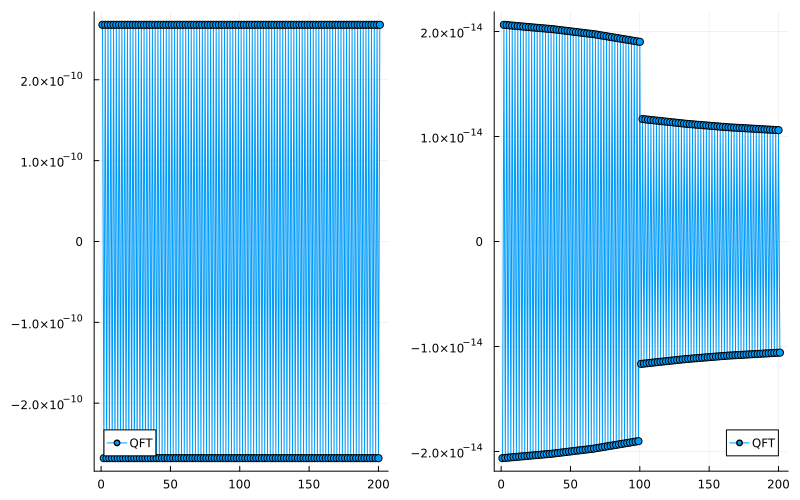

In [151]:
p1 = plot(real.(data_τ), marker=:circle, label="QFT")
p2 = plot(imag.(data_τ), marker=:circle, label="QFT")
plot(p1, p2, size=(800, 500))

In [149]:
data_x = [
    _evaluate(hfmps2_reverse, sites_kl, QG.origcoord_to_quantics(wkgrid, (ind0, w)))
    for w in sparse1dgrid]

201-element Vector{ComplexF64}:
   2.646809131960118e-10 + 1.7466702204462129e-15im
  -2.647464014557183e-10 - 1.7041948513810192e-15im
  2.6481123517423237e-10 + 1.6594161349913704e-15im
 -2.6487541417249184e-10 - 1.612335277759427e-15im
  2.6493893966441365e-10 + 1.5633855060852878e-15im
  -2.650018105674571e-10 - 1.5134312354507916e-15im
   2.650640281235473e-10 + 1.462662401309532e-15im
 -2.6512559216276395e-10 - 1.4110773818348237e-15im
  2.6518650158426983e-10 + 1.3580905516783016e-15im
 -2.6524675779464243e-10 - 1.3051743313560806e-15im
                         ⋮
     2.6518680725461e-10 + 2.02293138613199e-15im
  -2.651258762799635e-10 - 2.053524588472444e-15im
   2.650642918629603e-10 + 2.083576287190726e-15im
  -2.650020541689715e-10 - 2.113084802042027e-15im
  2.6493916239282144e-10 + 2.141712987348391e-15im
 -2.6487561753369746e-10 - 2.1687136200691474e-15im
  2.6481141872094696e-10 + 2.1934637924966825e-15im
 -2.6474656612454247e-10 - 2.2159637065013734e-15im
  2.646810604

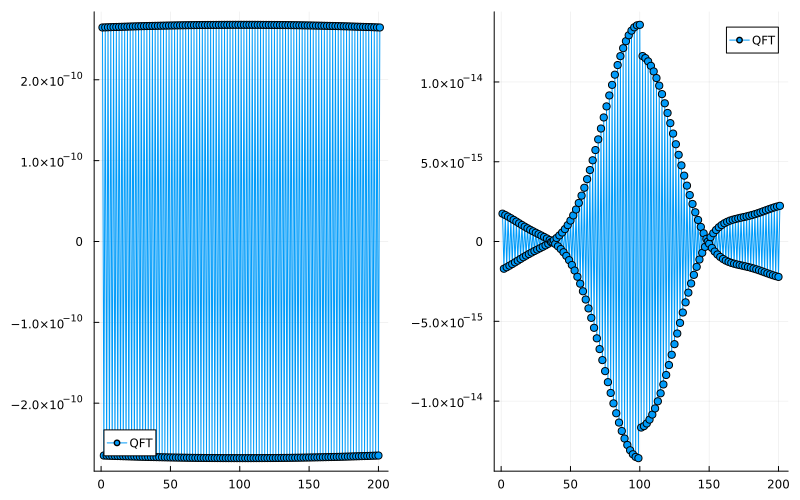

In [150]:
p1 = plot(real.(data_x), marker=:circle, label="QFT")
p2 = plot(imag.(data_x), marker=:circle, label="QFT")
plot(p1, p2, size=(800, 500))